# Abstract Screening

To reduce the burden for researchers to conduct a comprehensive SRMA, we can use ML methods to build models to screen studies automatically. 

The dataset is exported from our SRMA system by a `download_live_data.py` Python script. As the complexity of the dataset, I prepared this notebook to show how to use it for building a machine learning (ML) model.

Usually, due to the differences of projects, it's better to train seperate ML model for each project. For here, we use the dataset exported from IO project for a demonstration.

# Load all libraries

There are many packages needed to run this notebook.
Please install the missing packages when you see `ModuleNotFoundError: No module named XXXX` error shows.

In [2]:
# data processing
import pandas as pd
import numpy as np

# load / save data
import codecs
import json

# save models
import pickle

# show data better
from pprint import pprint

# for getting text features
from sentence_transformers import SentenceTransformer

# for visualization
import plotly.express as px

# for dimension reduction and visualization
import umap

# for machine learning
from sklearn.ensemble import RandomForestClassifier

# load the this helper function from sklearn
from sklearn.model_selection import train_test_split

# for evaluate model
from sklearn.metrics import classification_report

# for re-sampling dataset
from imblearn.combine import SMOTEENN

print('* loaded all libraries')

* loaded all libraries


# Load Data

The raw data is saved as a JSON file

In [3]:
# as we use UTF-8 format to save the data
# we need to use `codecs` to open the file
raw_data = json.load(
    codecs.open('IO-8164.json', 'r', 'utf-8')
)
print("* loaded %s records" % (
    len(raw_data['data'])
))

* loaded 8164 records


## Check the data structure

It's important to understand how the data structure is to conduct any further operation. So let's just print one as a sample.

As you can see, there are many attributes/elements for a single study, such as title, abstract, authors, publication date, journal, etc. And there are some information generated by the system automatically. 

In this sample, we just focus on the basic information and the decision label.

In [4]:
pprint(raw_data['data'][10])

{'abstract': 'Background: Parathyroid carcinoma (PC) is an extremely rare '
             'malignant tumor with an incidence of about 6 new cases per 10 '
             'million inhabitants per year. While several papers have been '
             'published on treatments and outcomes of PC patients with '
             'loco-regional disease, little is known about the prognosis, '
             'treatment strategies, and prognostic factors of patients with '
             'distant metastasis. &lt;br/&gt;Material(s) and Method(s): We '
             'performed a systematic review and a pooled analysis of '
             'histopathologically confirmed PC cases published in literature '
             'using the following keywords: '
             '&quot;metastasis-metastatic-secondary nodes&quot; AND '
             '&quot;parathyroid carcinoma&quot;. Original case reports and '
             'case series reporting metastatic parathyroid carcinoma were '
             'included. Data from 58 articles 

## Select and convert raw data to DataFrame

The raw format is not easy to use, so usually we will convert the raw data to a DataFrame which can be processed much easier as there are many scripts/functions for data pre-processing.

In addition, as the dataframe won't save too much information, we also want to build a dictionary for searching the details for future use.

In [6]:
# hold selected data as a list
rs = []

# a data dictionary for searching by pid(PMID or other id)
dd = {}

# check each record
for r in raw_data['data']:
    # save the information for building dataframe
    rs.append({
        'pid': r['pid'],
        'title': r['title'],
        'authors': r['authors'],
        'abstract': r['abstract'],
        'journal': r['journal'],
        'pub_date': r['pub_date'],
        # the label of decision
        'decision': r['ss_rs'],
    })
    
    # save to data dictionary
    dd[r['pid']] = r
    
df_all = pd.DataFrame(rs)
print('* loaded %s records' % (len(df_all)))

# output the first 5 records
df_all.head()

* loaded 8164 records


,pid,title,authors,abstract,journal,pub_date,decision
0,2019801890,Effects of Carbon Nanomaterials and Aloe vera ...,de Carvalho Lima E.N.; Barros Martins G.L.; Di...,Melanoma is an aggressive skin cancer that aff...,Pharmaceutics,October 2022,na
1,2015544162,Comorbidities and mortality rate in COVID-19 p...,Naimi A.; Yashmi I.; Jebeleh R.; Imani Mofrad ...,Introduction: The global pandemic of coronavir...,J. Clin. Lab. Anal.,May 2022,na
2,2018429700,MODERN BREAST CANCER THERAPY: FROM TAMOXIFEN T...,Shevchenko Ju.A.; Kuznetsova M.S.; Khristin A....,The purpose of the study was to conduct a syst...,Siberian J. Oncol.,2022,na
3,638894896,Atezolizumab plus Bevacizumab in Patients with...,Mao L.; Fang M.; Wei X.; Cao J.; Lin J.; Zhang...,PURPOSE: Anti-programmed cell death-1 monother...,Clin Cancer Res,01 Nov 2022,na
4,2020873780,"Lifileucel, a Tumor-Infiltrating Lymphocyte Th...",Sarnaik A.A.; Hamid O.; Khushalani N.I.; Lewis...,PURPOSE Effective treatment options are limite...,J. Clin. Oncol.,20 Aug 2021,na


# Data Pre-processing

## Statistics on df

Now we can check more information on this data frame.

For example, we can check how the decisions are distributed in these 8k records.

As shown in the following example, there are many bars which represents different decisions:

- na: no decision yet for this paper
- e1: excluded due to duplicate paper
- e2: excluded by checking the paper title
- e22: excluded by checking the paper abstract
- e3: excluded by checking the full text of the paper
- e4: excluded for other reason
- f1: included in a systematic review
- f3: included in both systematic review and meta-analysis

So, if we want to use this data for training, we need to exclude those `na` records as they are not labeled yet by reviewer. 

For those records with eX (e.g., e1, e2, e3, etc.), we can treat them as EXCLUDED for simplicity. For those with f1 and f3, we can treat them as INCLUDED.

<AxesSubplot:>

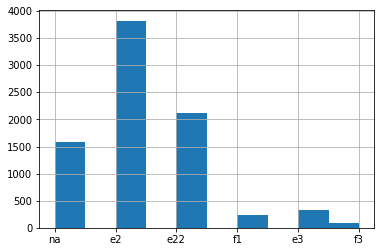

In [7]:
df_all['decision'].hist()

## Add classification label

For ML models, `y` represents the output classification label. And `0` represents negative case (i.e., excluded), `1` represents positive case (i.e., included).

We need to convert the `eX` and `fX` to `0` and `1` in the dataframe and remove those `na`.

In [8]:
# first, remove those na records
df = df_all[df_all['decision'] != 'na']
print('* left %s records after removing na' % (len(df)))

# second, convert the decision to y
def func_decision_to_y(r):
    if r['decision'] in ['f1', 'f3']:
        return 1
    else:
        return 0
    
df['y'] = df.apply(func_decision_to_y, axis=1)

# let's see how the updated dataframe looks like
df.head()

* left 6584 records after removing na


/Users/m210842/.local/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


,pid,title,authors,abstract,journal,pub_date,decision,y
1347,2018048671,A Systematic Review and Meta-Analysis of Immun...,Wang Y.; Kong D.; Wang C.; Chen J.; Li J.; Liu...,Objective: We aimed to evaluate immune-related...,Technol. Cancer Res. Treat.,2020,e2,0
1348,2018071173,Evolving landscape of first-line combination t...,Lalani A.-K.A.; Heng D.Y.C.; Basappa N.S.; Woo...,Background: Renal cell carcinoma (RCC) is a co...,Ther. Adv. Med. Oncol.,2022,e2,0
1349,2013308385,Cardiotoxicity associated with immune checkpoi...,Rubio-Infante N.; Ramirez-Flores Y.A.; Castill...,Aims: This study aimed to estimate the inciden...,Eur. J. Heart Fail.,October 2021,e2,0
1350,2014514108,Sarcopenia&apos;s prognostic impact on patient...,Lee D.; Kim N.W.; Kim J.Y.; Lee J.H.; Noh J.H....,Background: Although sarcopenia has been repor...,J. Clin. Med.,November-2 2021,e2,0
1351,2017980445,Toripalimab Combined With Hepatic Arterial Inf...,Xu Y.-J.; Lai Z.-C.; He M.-K.; Bu X.-Y.; Chen ...,Purpose: Immunotherapy combined with chemother...,Technol. Cancer Res. Treat.,2021,e2,0


## Check distribution

Let's see how the labels are distributed. 
As you can see, 1 is very few compared with 0.

In ML fields, it's called imbalanced/unbalanced dataset, which is frustrating when building ML models. It's very common, but still need to be carefull when facing this issue. There are some methods to solve this issue (no perfect methods), but still challenging.

* y=1: 314
* y=0: 6270


<AxesSubplot:>

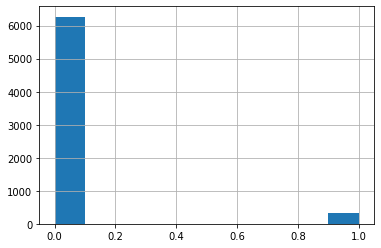

In [9]:
print('* y=1: %s' % (len(df[df['y']==1])))
print('* y=0: %s' % (len(df[df['y']==0])))
df['y'].hist()

## Get text features

For a text classification task, a very important step is get the text representations, which makes the texts 'computable' for ML models.

There are MANY methods to implement this conversion and usually it takes a lot of rounds to improve the quality of features. For example, TF-IDF, BERT-based embeddings, KG-based embeddings, etc.

In this case, we will use a popular sentence-transformer method (also BERT-based) method to convert texts into features.

### Load models

To use sentence-transformer, some packages must be install in advance.
More information about the sentence embedding can be found at:
https://huggingface.co/sentence-transformers.

Install the following first if shows error
```bash
pip install -U sentence-transformers
```

In [10]:
# load model
model_name = 'multi-qa-MiniLM-L6-cos-v1'
model = SentenceTransformer(model_name)
print('* loaded model!')

* loaded model!


### Convert text to vector

Now, we can use the `model` to encode the texts.

The conversion also has several methods, the simplest one is just use sentence-level encoding directly. The encoder will take the whole sentence as input and convert to vector. As a result, some useless/negative tokens may also be taken into vector.

For here, we can use title and abstract for text features. Each text is converted to a 384-dimension vector, and two text features will produce a 768-dimension vector. As there are 6584 records, the feature matrix size will be `6584 x 768`.

But this feature matrix size may be too large and sparse.

### Feature 1: Title Text

In [11]:
embeddings_title = model.encode(df.title.tolist())
print('* got title embeddings: ', embeddings_title.shape)

* got title embeddings:  (6584, 384)


### Feature 2: Abstract Text

In [38]:
embeddings_abs = model.encode(df.abstract.tolist())
print('* got abstract embeddings: ', embeddings_abs.shape)

* got abstract embeddings:  (6584, 384)


### Save embeddings

It takes very long time to get all the embeddings (seconds to hours, depends on the machine).
So, to reuse and avoid re-calculate, save the dataset

In [13]:
# create a dataset object for saving
dataset = {
    'embeddings_title': embeddings_title,
    'embeddings_abs': embeddings_abs,
    'y': df.y.tolist()
}

with open('dataset.pkl', 'wb') as f:
    pickle.dump(dataset, f)
    
print('* saved all data')

* saved all data


### Load embeddings

If the `dataset.pkl` already exists, just load it.

In [14]:
dataset = pickle.load(open('dataset.pkl', 'rb'))
embeddings_title = dataset['embeddings_title']
print('* got title embeddings: ', embeddings_title.shape)

embeddings_abs = dataset['embeddings_abs']
print('* got abstract embeddings: ', embeddings_abs.shape)

* got title embeddings:  (6584, 384)
* got abstract embeddings:  (6584, 384)


## Get other features

The text feature may not catch important information about inclusion/exclusion criteria, so we can add more features to each record based on expert experience and inclusion/exclusion criteria.

### Feature 1: is RCT?

/Users/m210842/.local/lib/python3.7/site-packages/ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<AxesSubplot:>

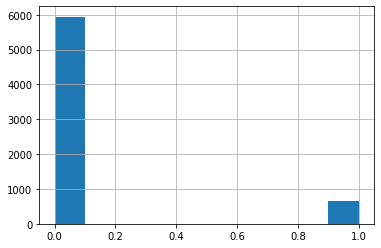

In [15]:
def func_get_rct(r):
    '''
    For a given r, guess whether it is a RCT.
    If it is RCT, return 1. Else return 0.
    
    We can use the result by ROBOTSEARCH_RCT as a referene
    '''
    # get pid for this record
    pid = r['pid']
    
    # search full data in data dictionary
    d = dd[pid]
    
    # get ROBOTSEARCH_RCT results
    if 'pred_dict' in d['meta']:
        is_rct = d['meta']['pred_dict']['ROBOTSEARCH_RCT']['is_rct']
    else:
        # in fact, the ROBOTSEARCH_RCT prediction may not be available.
        return 0
    
    if is_rct:
        return 1
    else:
        return 0

df['is_rct'] = df.apply(lambda r: func_get_rct(r), axis=1)

# Let's see how the is_RCT distributes.
# Obviously, most of the studies are not RCT.
df['is_rct'].hist()

### Feature 2: Which phase

/Users/m210842/.local/lib/python3.7/site-packages/ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<AxesSubplot:>

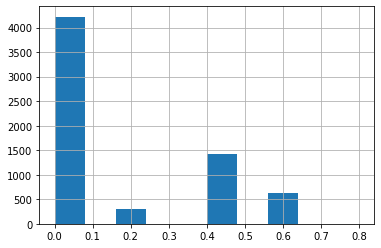

In [16]:
def func_get_phase(r):
    '''
    For a given r, get the phase information.
    
    As there are different stage, we need to convert the phase to a number:
    
    Not mentioned:   0
    Phase 1:         0.2
    Phase 2:         0.4
    Phase 3:         0.6
    Phase 4:         0.8
    Phase 5:         1
    
    This can be further improved to indicate small differences, such as 1b, 2b, etc.
    '''
    # let's just guess by the title
    # to avoid upper/lower case issue, convert to lower case 
    title = r['title'].lower()
    
    # let's check each phase
    # this part can be improved by NLP algorithms in future
    if 'phase v' in title or 'phase 5' in title:
        return 1
    if 'phase iv' in title or 'phase 4' in title:
        return 0.8
    if 'phase iii' in title or 'phase 3' in title:
        return 0.6
    elif 'phase ii' in title or 'phase 2' in title:
        return 0.4
    elif 'phase i' in title or 'phase 1' in title:
        return 0.2
    else:
        return 0

df['which_phase'] = df.apply(lambda r: func_get_phase(r), axis=1)

# Let's see how the phase distributes.
# Obviously, most of the studies do not show phase
# and there are a lot showing phase 2 (>1400)
# a lot showing phase 3 (>500)
df['which_phase'].hist()

### Feature 3: is SRMA?

Usually the SRMA studies will be excluded, so this can be used an feature.

For example, "systematic review" and "meta-analysis" show in a title "Comorbidities and mortality rate in COVID-19 patients with hematological malignancies: A systematic review and meta-analysis.", then we should indicate this finding an attribute.

/Users/m210842/.local/lib/python3.7/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<AxesSubplot:>

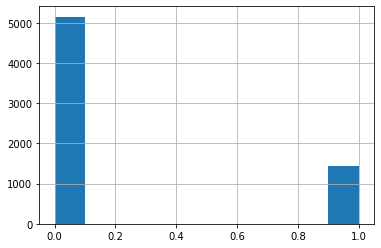

In [17]:
def func_get_srma(r):
    '''
    For given r, determine whether it is a SRMA study
    
    if it is a SRMA study, return 1. 
    else return 0.
    '''
    # let's just guess by the title
    # to avoid upper/lower case issue, convert to lower case 
    title = r['title'].lower()
    
    if 'systematic review' in title or 'meta-analysis' in title:
        return 1
    else:
        return 0
    
df['is_srma'] = df.apply(lambda r: func_get_srma(r), axis=1)

# Let's see how the SRMA study distributes.
# More than 1300 I guess
df['is_srma'].hist()

# EDA (Optional)

Usually, before we dive into the model training, often an exploratory data analysis is performed to better understand the distribution of the data.

For those structured data, such as age, gender, and race, a histogram is good enough to understand the single attribute distribution. And a scatter matrix or joint-histogram matrix is also good for better understanding of joint-distribution.

However, for unstructure data or text data, it's not that simple. 
We need to pre-process the data first to get some quantitative measures to understand how the data looks like.

For here, as we have already get the embeddings of title and abstract, we can use the embeddings to see how the distributions look like.

For here, we use the UMAP dimension reduction technique to map the original high dimensional data to a 2d plane for visualization. And we use Plotly for interactive exploration

## Prepare EDA data

Usually, we can use the same dataframe for EDA.
But for better exploration, we often update the dataframe to make it easier to be displayed.
So we create a copy of the dataframe `dfv` for visualization.

In [18]:
# for better visualizaion, create a temp dataframe dfv
dfv = df.copy()

# wrap long title
dfv['title_wrap'] = dfv.title.str.wrap(30)
dfv['title_wrap'] = dfv.title_wrap.apply(lambda x: x.replace('\n', '<br>'))
dfv.head()

,pid,title,authors,abstract,journal,pub_date,decision,y,is_rct,which_phase,is_srma,title_wrap
1347,2018048671,A Systematic Review and Meta-Analysis of Immun...,Wang Y.; Kong D.; Wang C.; Chen J.; Li J.; Liu...,Objective: We aimed to evaluate immune-related...,Technol. Cancer Res. Treat.,2020,e2,0,0,0.0,1,A Systematic Review and Meta-<br>Analysis of I...
1348,2018071173,Evolving landscape of first-line combination t...,Lalani A.-K.A.; Heng D.Y.C.; Basappa N.S.; Woo...,Background: Renal cell carcinoma (RCC) is a co...,Ther. Adv. Med. Oncol.,2022,e2,0,0,0.0,1,Evolving landscape of first-<br>line combinati...
1349,2013308385,Cardiotoxicity associated with immune checkpoi...,Rubio-Infante N.; Ramirez-Flores Y.A.; Castill...,Aims: This study aimed to estimate the inciden...,Eur. J. Heart Fail.,October 2021,e2,0,0,0.0,1,Cardiotoxicity associated with<br>immune check...
1350,2014514108,Sarcopenia&apos;s prognostic impact on patient...,Lee D.; Kim N.W.; Kim J.Y.; Lee J.H.; Noh J.H....,Background: Although sarcopenia has been repor...,J. Clin. Med.,November-2 2021,e2,0,0,0.0,1,Sarcopenia&apos;s prognostic<br>impact on pati...
1351,2017980445,Toripalimab Combined With Hepatic Arterial Inf...,Xu Y.-J.; Lai Z.-C.; He M.-K.; Bu X.-Y.; Chen ...,Purpose: Immunotherapy combined with chemother...,Technol. Cancer Res. Treat.,2021,e2,0,0,0.0,0,Toripalimab Combined With<br>Hepatic Arterial ...


## Explore the structure data

First, let's see if the `is_rct` affects the decision. 
It seems not obvious differences.

In [19]:
dfv.groupby(by=['is_rct', 'y'])[['pid']].count()

pid
is_rct y      
0      0  5661
       1   281
1      0   609
       1    33

Second, how about the `is_srma`?
It seems the SRMA study has much higher chance to be included.

In [20]:
dfv.groupby(by=['is_srma', 'y'])[['pid']].count()

pid
is_srma y      
0       0  4983
        1   173
1       0  1287
        1   141

Third, `which_phase`.
It seems Phase 3 (which_phase=0.6) has much higher chance

In [21]:
dfv.groupby(by=['which_phase', 'y'])[['pid']].count()

pid
which_phase y      
0.0         0  4017
            1   204
0.2         0   306
            1     1
0.4         0  1400
            1    24
0.6         0   546
            1    85
0.8         0     1

## Explore the text data

To explore the text data, a simple way is just get a small sample and browse each one to see if there is any pattern.
But this method doesn't apply to very large dataset as it is not efficient.

In previous step, we have already got the text embeddings, so we can use some dimension reduction techniques to project the high-dimensonal vectors to a lower space (i.e., 2d plane). There are many dimension reduction techniques, such as PCA, LDA, t-SNE, and the most recent and popular method UMAP. There are pros and cons for each method, but in most time, t-SNE and UMAP are good enough, and UMAP is more popular as its performance advantage (UMAP is much faster than t-SNE).

So for this demo, we use UMAP to transform the text data.

In [22]:
# let's dimension reduction on title embeddings
embedding2d = umap.UMAP().fit_transform(
    embeddings_title
)

# bind to dataframe for vis
dfv['ebd_t2d_x'] = embedding2d[:, 0]
dfv['ebd_t2d_y'] = embedding2d[:, 1]

Then, we can use scatter plot to see how the data looks like.

As you can see, the yellow dots are those included (y=1), and the blue dots are those excluded (y=0). 

But unfortunately, we don't see any obvious pattern.

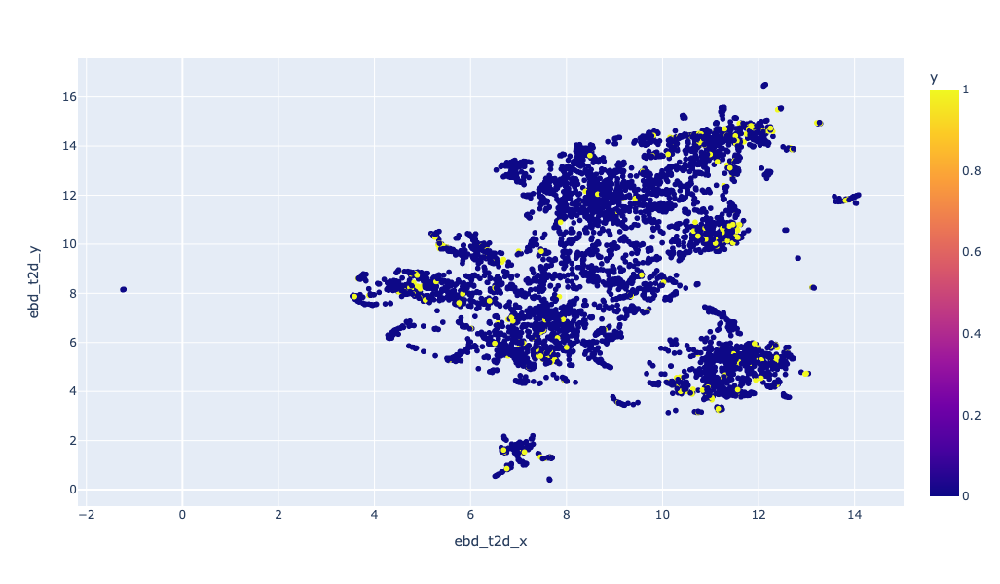

In [23]:
# make it ea
fig = px.scatter(
    dfv,
    x='ebd_t2d_x', 
    y='ebd_t2d_y',
    color='y',
    hover_data=[
        'title_wrap',
        'journal',
        'decision'
    ],
    height=600
)
# add hover template for complex vis
# fig.update_traces(hovertemplate="Decision: %{text}")

fig.show()

Now let's check the distribution of abstracts.

Unfortunately, no obvious pattern.

In [24]:
# let's dimension reduction on abs embeddings
embedding_abs_2d = umap.UMAP().fit_transform(
    embeddings_abs
)

# bind to dataframe for vis
dfv['ebd_a2d_x'] = embedding_abs_2d[:, 0]
dfv['ebd_a2d_y'] = embedding_abs_2d[:, 1]

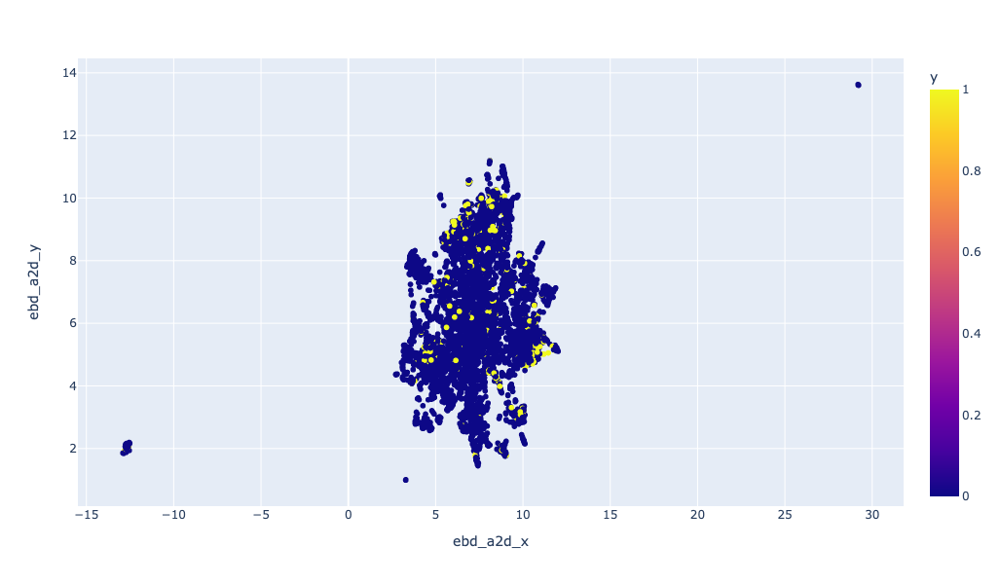

In [25]:
# make it ea
fig = px.scatter(
    dfv,
    x='ebd_a2d_x', 
    y='ebd_a2d_y',
    color='y',
    hover_data=[
        'title_wrap',
        'journal',
        'decision'
    ],
    height=600
)
# add hover template for complex vis
# fig.update_traces(hovertemplate="Decision: %{text}")

fig.show()

# Prepare dataset

Before building the ML model, we need to preare the dataset for training.

First, we need to combine all the features and convert to a matrix format which can be read by trainer program.

The shape of one text embedding is `(N, 384)`, and the shape of all other features is `(N, 3)`.
So the shape of the final matrix is:

$$
(N, 384 + 384 + 3) = (N, 771)
$$

In [26]:
# combine the dataset
X = np.concatenate([
    # text features
    embeddings_title, 
    embeddings_abs,
    
    # other features
    df[['which_phase', 'is_rct', 'is_srma']].to_numpy(),
],
    axis=1
)
y = df.y.to_numpy()
print('* combined feature vector:', X.shape)
print('* y:', y.shape)


* combined feature vector: (6584, 771)
* y: (6584,)


## Split train and test

For train and test, we need to split the dataset into two parts.

Usually, we can use 20%-25% for test, and the rest for training.

In [27]:
X_train, X_test, y_train, y_test = train_test_split(
    X, 
    y,
    test_size=0.2, 
    random_state=42
)
print('* X_train:', X_train.shape)
print('* X_test:', X_test.shape)
print('* y_train:', y_train.shape)
print('* y_test:', y_test.shape)

* X_train: (5267, 771)
* X_test: (1317, 771)
* y_train: (5267,)
* y_test: (1317,)


## Over- and Under-sampling

As we already know, the dataset is imbalanced which can cause a biased model, which cannot classify/identify the minority.

To overcome the imbalanced data issue, there are a lot of studies covering many aspects.
The simplest one that we can do is re-sampling the training set.

For more information, please check https://imbalanced-learn.org/stable/index.html

As you can see, after resample, the data distribution changed significantly.

In [28]:
from collections import Counter

# let's try the SMOTEENN method 
from imblearn.combine import SMOTEENN

# create an instance of SMOTEENN
smote_enn = SMOTEENN(random_state=0)

# before resample
print("* original distribution:", sorted(Counter(y_train).items()))

# resample
X_train_resampled, y_train_resampled = smote_enn.fit_resample(X_train, y_train)
print("* resampled distribution:", sorted(Counter(y_train_resampled).items()))

* original distribution: [(0, 5006), (1, 261)]
* resampled distribution: [(0, 2480), (1, 4972)]


# Build Model

In fact, there are so many model available in the machine learning world. You can choose whatever you want for a project. For here, we just use a Random Forest which is easy to get and good for high-dimensional datasets.

In practice settings, building model has many options. It take a long time to fine-tune hyperparameters and get a balanced result.

Try to enjoy it!

In [29]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(max_depth=8, random_state=0)
print('* created a RFC model')

* created a RFC model


## Train Model

Training model is very simple, just call the `fit()` function on the training dataset.
And for our case, we can use the resampled dataset.

Depends on which model to use, the training time varies significantly from seconds to days.

The model we are using is a commonly used model in industry for better performance.

In [30]:
model.fit(X_train_resampled, y_train_resampled)
print('* trained model')

* trained model


## Evaluate Model

Then, we can create a detailed report. 

If we don't resample, the precision and recall for `1` are 0, which means the model cannot identify those "included" studies from other excluded studies. It just simplely excluded everything. As the training set is so imbalanced, the model cannot learn the feature correctly.

After resampling, the precision and recall are much better. But we still need to be careful because this result is based on the re-sampled dataset. 

For imbalanced data, it's hard to get a perfect result.
But if we can achieve **low precision + high recall** on the target label, then the model can detect the target label very well, which means we can trust the result as it doesn't miss much targets.

In the following report, we can find:

```
              precision    recall  f1-score   support

           0       0.99      0.80      0.88      1264
           1       0.14      0.79      0.24        53
```

which means:

1. for the target label `0` (exclusion), if model decides exclusion, 99% it is correct.
2. for the target label `1` (inclusion), if model decides inclusion, 14% it is correct, but the model only has (1-0.79)=21% chance of missing. So if the recall can be optimized to >95%, then reviewers can still trust they won't miss candidates in those "inclusion" studies.

In [31]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# get the prediction value
y_pred = model.predict(X_test)

print('Accuracy     : %.3f'%accuracy_score(y_test, y_pred))
print('Precision    : %.3f'%precision_score(y_test, y_pred))
print('Recall       : %.3f'%recall_score(y_test, y_pred))
print('F1-Score     : %.3f'%f1_score(y_test, y_pred))
print('\nClassification Report : ')
print(classification_report(y_test, y_pred))

Accuracy     : 0.798
Precision    : 0.141
Recall       : 0.792
F1-Score     : 0.240

Classification Report : 
              precision    recall  f1-score   support

           0       0.99      0.80      0.88      1264
           1       0.14      0.79      0.24        53

    accuracy                           0.80      1317
   macro avg       0.57      0.80      0.56      1317
weighted avg       0.96      0.80      0.86      1317

